# Feature Engineering Exercise

In [59]:
import pandas as pd
import os

In this exercise, we will explore different feature engineering ideas.

The feature engineering process can be described as follows:
1. Explore your data and answer important questions about your data
  - What is the format of the data?
  - How much data do we have?
  - Describe the data: what columns do we have for each record, and what values do they contain?
  - Where is the data from?
  - What problem are we trying to solve?
  - __What features might we need to solve this problem?__
2. Form a hypothesis and gather additional data if needed
  - Conduct interviews if needed to gain domain knowledge
3. Experiment with potential features and understand correlations between them
4. Review features with audience and validate domain knowledge
5. Build machine learning models and refine your features

In [60]:
pwd

'C:\\Users\\deesaw\\Desktop\\MLG-07 USI\\day_1\\code'

In [74]:
df = pd.read_csv('C:\\Users\\deesaw\\Desktop\\MLG-07 USI\\day_1\\data\\2019 County Health Rankings Data - v2.csv')

In [75]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
FIPS,3142.0,30383.649268,15162.508374,1001.0,18177.500,29176.0,45080.50,56045.0
Years of Potential Life Lost Rate,2908.0,8522.752063,2636.067751,2900.0,6697.500,8164.5,10045.50,29783.0
% Fair/Poor,3142.0,17.478994,4.708373,8.0,14.000,17.0,20.00,41.0
Physically Unhealthy Days,3142.0,3.921992,0.714785,2.3,3.400,3.9,4.40,7.2
Mentally Unhealthy Days,3142.0,3.931604,0.614499,2.4,3.500,3.9,4.30,6.0
% LBW,3035.0,8.111697,2.070856,3.0,7.000,8.0,9.00,26.0
% Smokers,3142.0,17.867919,3.667239,7.0,15.000,17.0,20.00,43.0
% Obese,3142.0,32.125080,4.599871,14.0,29.000,32.0,35.00,50.0
Food Environment Index,3123.0,7.465738,1.165679,0.0,6.900,7.7,8.20,10.0
% Physically Inactive,3142.0,25.751432,5.182344,8.0,22.000,26.0,29.00,45.0


In [76]:
df.head()

,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% LBW,% Smokers,% Obese,...,Violent Crime Rate,# Injury Deaths,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,Severe Housing Cost Burden,Overcrowding,% Drive Alone,# Workers who Drive Alone,% Long Commute - Drives Alone
0,1001,Alabama,Autauga,8824.0,18,4.2,4.3,8.0,19,38,...,272.0,205.0,74.0,11.7,15,13,2,86,20911,38
1,1003,Alabama,Baldwin,7225.0,18,4.1,4.2,8.0,17,31,...,204.0,708.0,69.0,10.3,14,13,1,85,74415,41
2,1005,Alabama,Barbour,9586.0,26,5.1,4.6,11.0,22,44,...,414.0,96.0,73.0,11.5,15,14,2,83,7242,34
3,1007,Alabama,Bibb,11784.0,20,4.4,4.3,11.0,20,38,...,89.0,113.0,100.0,11.2,11,11,0,86,6930,49
4,1009,Alabama,Blount,10908.0,21,4.5,4.7,8.0,20,34,...,483.0,304.0,105.0,11.7,10,8,2,87,18426,60


In [77]:
df_copy=df.copy()

In [78]:
df_copy.head()

,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% LBW,% Smokers,% Obese,...,Violent Crime Rate,# Injury Deaths,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,Severe Housing Cost Burden,Overcrowding,% Drive Alone,# Workers who Drive Alone,% Long Commute - Drives Alone
0,1001,Alabama,Autauga,8824.0,18,4.2,4.3,8.0,19,38,...,272.0,205.0,74.0,11.7,15,13,2,86,20911,38
1,1003,Alabama,Baldwin,7225.0,18,4.1,4.2,8.0,17,31,...,204.0,708.0,69.0,10.3,14,13,1,85,74415,41
2,1005,Alabama,Barbour,9586.0,26,5.1,4.6,11.0,22,44,...,414.0,96.0,73.0,11.5,15,14,2,83,7242,34
3,1007,Alabama,Bibb,11784.0,20,4.4,4.3,11.0,20,38,...,89.0,113.0,100.0,11.2,11,11,0,86,6930,49
4,1009,Alabama,Blount,10908.0,21,4.5,4.7,8.0,20,34,...,483.0,304.0,105.0,11.7,10,8,2,87,18426,60


In [79]:
#df['State'].value_counts()
df['County'].value_counts()


Washington     31
Jefferson      26
Franklin       25
Lincoln        24
Jackson        24
               ..
Chaves          1
Crenshaw        1
Koochiching     1
Gentry          1
Coal            1
Name: County, Length: 1850, dtype: int64

In [80]:
df.shape

(3142, 57)

In [81]:
df.isnull()

,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% LBW,% Smokers,% Obese,...,Violent Crime Rate,# Injury Deaths,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,Severe Housing Cost Burden,Overcrowding,% Drive Alone,# Workers who Drive Alone,% Long Commute - Drives Alone
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3138,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
3139,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3140,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [82]:
df['State'].nunique()

51

In [83]:
df['County'].nunique()

1850

In [84]:
df.drop(columns='County',inplace=True)
df.drop(columns='% Uninsured',inplace=True)

In [94]:
df.drop(columns='Dentist Rate',inplace=True)
df.drop(columns='MHP Rate',inplace=True) 
df.drop(columns='% Drive Alone',inplace=True)
df.drop(columns='Association Rate',inplace=True) 
df.drop(columns='Injury Death Rate',inplace=True)
df.drop(columns='% Long Commute - Drives Alone',inplace=True) 
df.drop(columns='PCP Rate',inplace=True) 
df.drop(columns='% Some College',inplace=True) 
df.drop(columns='% Unemployed',inplace=True) 
df.drop(columns='% Single-Parent Households',inplace=True) 
df.drop(columns='Chlamydia Rate',inplace=True) 

In [109]:
df.drop(columns='% Severe Housing Problems',inplace=True) 

In [110]:
df.columns

Index(['FIPS', 'State', 'Years of Potential Life Lost Rate', '% Fair/Poor',
       'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% LBW',
       '% Smokers', '% Obese', 'Food Environment Index',
       '% Physically Inactive', '% With Access', '% Excessive Drinking',
       '# Alcohol-Impaired Driving Deaths', '# Driving Deaths',
       '% Alcohol-Impaired', '# Chlamydia Cases', 'Teen Birth Rate',
       '# Uninsured', '# Primary Care Physicians', '# Dentists',
       '# Mental Health Providers', 'Preventable Hosp. Rate', '% Screened',
       '% Vaccinated', 'Cohort Size', 'Graduation Rate', '# Some College',
       'Population', '# Unemployed', 'Labor Force', '% Children in Poverty',
       'Income Ratio', '# Single-Parent Households', '# Households',
       '# Associations', 'Annual Average Violent Crimes', 'Violent Crime Rate',
       '# Injury Deaths', 'Average Daily PM2.5', 'Severe Housing Cost Burden',
       'Overcrowding', '# Workers who Drive Alone'],
      dtype='ob

In [111]:
df.head()

,FIPS,State,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% LBW,% Smokers,% Obese,Food Environment Index,...,# Single-Parent Households,# Households,# Associations,Annual Average Violent Crimes,Violent Crime Rate,# Injury Deaths,Average Daily PM2.5,Severe Housing Cost Burden,Overcrowding,# Workers who Drive Alone
0,1001,Alabama,8824.0,18,4.2,4.3,8.0,19,38,7.2,...,3315.0,13421.0,70,149.0,272.0,205.0,11.7,13,2,20911
1,1003,Alabama,7225.0,18,4.1,4.2,8.0,17,31,8.0,...,11252.0,44679.0,223,408.0,204.0,708.0,10.3,13,1,74415
2,1005,Alabama,9586.0,26,5.1,4.6,11.0,22,44,5.6,...,3140.0,5488.0,22,106.0,414.0,96.0,11.5,14,2,7242
3,1007,Alabama,11784.0,20,4.4,4.3,11.0,20,38,7.6,...,1381.0,4671.0,23,20.0,89.0,113.0,11.2,11,0,6930
4,1009,Alabama,10908.0,21,4.5,4.7,8.0,20,34,8.5,...,3986.0,13480.0,52,279.0,483.0,304.0,11.7,8,2,18426


In [112]:
df.isnull().sum()

FIPS                                 0
State                                0
Years of Potential Life Lost Rate    0
% Fair/Poor                          0
Physically Unhealthy Days            0
Mentally Unhealthy Days              0
% LBW                                0
% Smokers                            0
% Obese                              0
Food Environment Index               0
% Physically Inactive                0
% With Access                        0
% Excessive Drinking                 0
# Alcohol-Impaired Driving Deaths    0
# Driving Deaths                     0
% Alcohol-Impaired                   0
# Chlamydia Cases                    0
Teen Birth Rate                      0
# Uninsured                          0
# Primary Care Physicians            0
# Dentists                           0
# Mental Health Providers            0
Preventable Hosp. Rate               0
% Screened                           0
% Vaccinated                         0
Cohort Size              

In [113]:
df.dropna(inplace=True)

In [114]:
df.shape

(2409, 43)

In [115]:
df.dtypes

FIPS                                   int64
State                                 object
Years of Potential Life Lost Rate    float64
% Fair/Poor                            int64
Physically Unhealthy Days            float64
Mentally Unhealthy Days              float64
% LBW                                float64
% Smokers                              int64
% Obese                                int64
Food Environment Index               float64
% Physically Inactive                  int64
% With Access                        float64
% Excessive Drinking                   int64
# Alcohol-Impaired Driving Deaths    float64
# Driving Deaths                     float64
% Alcohol-Impaired                   float64
# Chlamydia Cases                    float64
Teen Birth Rate                      float64
# Uninsured                          float64
# Primary Care Physicians            float64
# Dentists                           float64
# Mental Health Providers            float64
Preventabl

In [116]:
import seaborn as sns
sns.pairplot(df)

In [22]:
import seaborn as sns
import matplotlib as plt

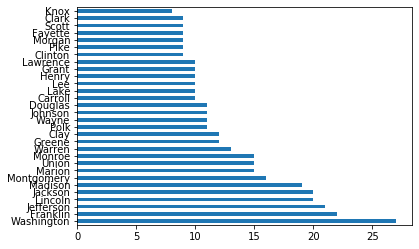

In [30]:
df['County'].value_counts().head(30).plot(kind='barh')

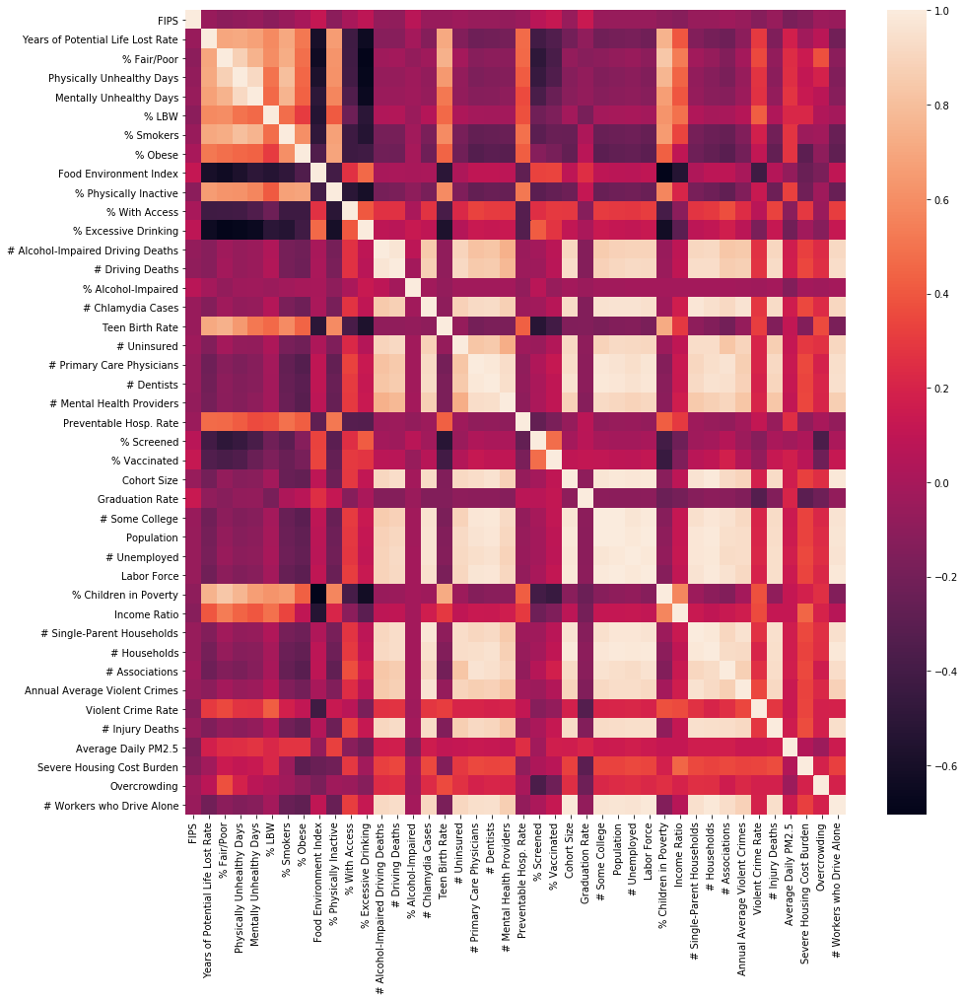

In [117]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
sns.heatmap(df.corr())

In [119]:
df.corr()['Years of Potential Life Lost Rate']

FIPS                                -0.057289
Years of Potential Life Lost Rate    1.000000
% Fair/Poor                          0.695986
Physically Unhealthy Days            0.711617
Mentally Unhealthy Days              0.676374
% LBW                                0.585906
% Smokers                            0.705578
% Obese                              0.519915
Food Environment Index              -0.593782
% Physically Inactive                0.658863
% With Access                       -0.421265
% Excessive Drinking                -0.637846
# Alcohol-Impaired Driving Deaths   -0.119997
# Driving Deaths                    -0.123106
% Alcohol-Impaired                  -0.005397
# Chlamydia Cases                   -0.135739
Teen Birth Rate                      0.708055
# Uninsured                         -0.143423
# Primary Care Physicians           -0.221640
# Dentists                          -0.204958
# Mental Health Providers           -0.194858
Preventable Hosp. Rate            

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
    #OnehotEncoding
ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(sparse=False,handle_unknown='ignore'), [1,2])], remainder='passthrough')
X = ct.fit_transform(df)


In [42]:
import seaborn as sns

In [48]:
categorial = ['County','State']
main_df = pd.get_dummies(df, columns=categorial, drop_first=True)
main_df.head()

,FIPS,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% LBW,% Smokers,% Obese,Food Environment Index,% Physically Inactive,...,State_South Carolina,State_South Dakota,State_Tennessee,State_Texas,State_Vermont,State_Virginia,State_Washington,State_West Virginia,State_Wisconsin,State_Wyoming
0,1001,8824.0,18,4.2,4.3,8.0,19,38,7.2,31,...,0,0,0,0,0,0,0,0,0,0
1,1003,7225.0,18,4.1,4.2,8.0,17,31,8.0,24,...,0,0,0,0,0,0,0,0,0,0
2,1005,9586.0,26,5.1,4.6,11.0,22,44,5.6,28,...,0,0,0,0,0,0,0,0,0,0
3,1007,11784.0,20,4.4,4.3,11.0,20,38,7.6,35,...,0,0,0,0,0,0,0,0,0,0
4,1009,10908.0,21,4.5,4.7,8.0,20,34,8.5,29,...,0,0,0,0,0,0,0,0,0,0


In [50]:
main_df.shape

(2409, 1578)

## Problem: _Predict a County's Health Ranking_

C:\Users\deesaw\Anaconda3\lib\site-packages\seaborn\categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


<Figure size 1080x720 with 0 Axes>

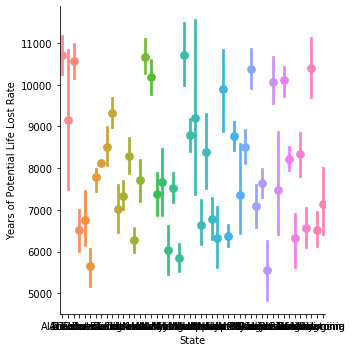

In [55]:
plt.figure(figsize=(15,10))
sns.factorplot(x="State", y="Years of Potential Life Lost Rate", hue="State", data=df);
#y="Years of Potential Life Lost Rate", hue="State"

In [57]:
df['State'].nunique()

48

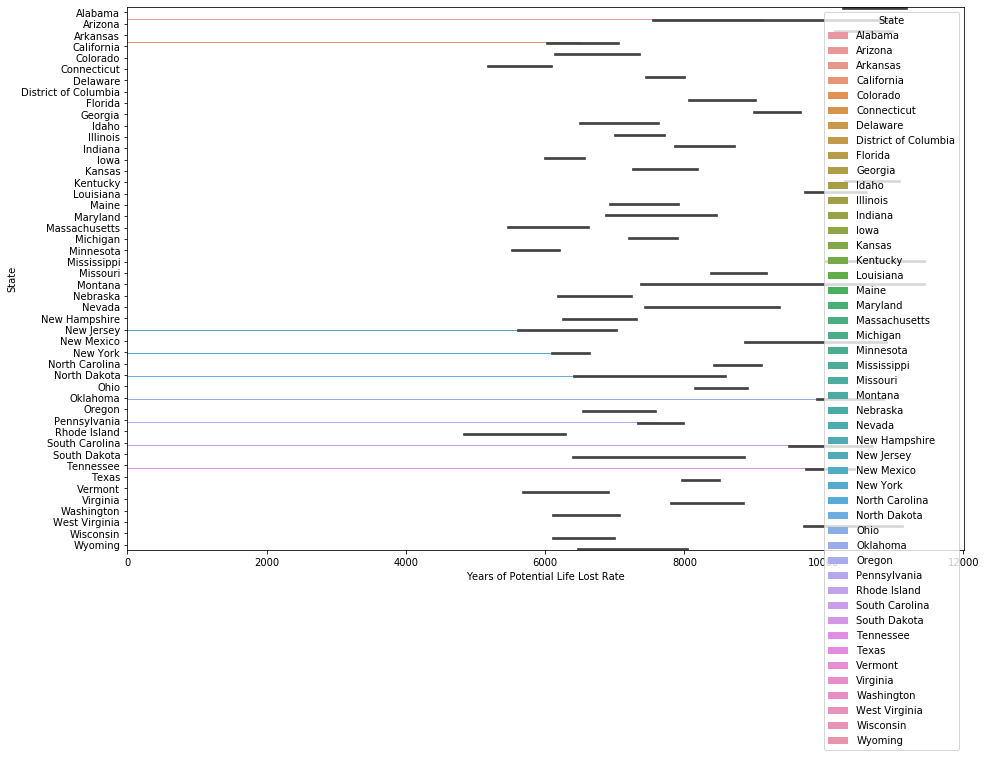

In [122]:
plt.figure(figsize=(15,10))
sns.barplot(y="State", x="Years of Potential Life Lost Rate", hue="State", data=df);

![image.png](attachment:image.png)

#### Data: Long Term Healthcare Facility Data (8 datasets, 2 years, 4 quarters)

https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation

https://data.medicare.gov/data/archives/home-health-compare

Information for research: https://longtermcare.acl.gov/

#### Assignment
- Brainstorm features (10 min.)
- Discuss features as a pair (15 min.)
- Explore data and research (15 min.)
- Generate features and explore correlations (30 min.)